## Problem_statement-03
# **Finetunning the pre-trained resnet50 model using LoRA on the train split of Galaxyzoo dataset and evaluate it on its test split**

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/galaxy-zoo-the-galaxy-challenge/all_ones_benchmark.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/images_test_rev1.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/central_pixel_benchmark.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/images_training_rev1.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/all_zeros_benchmark.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/training_solutions_rev1.zip


## Importing Libraries

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import random
from importlib import reload
import glob
from shutil import copyfile
import keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Flatten, Dense, Input, Add, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras import optimizers

## Defining the class labels

In [4]:
classes = [
    'Class1.1', 'Class1.2', 'Class1.3', 'Class2.1', 'Class2.2', 'Class3.1',
    'Class3.2', 'Class4.1', 'Class4.2', 'Class5.1', 'Class5.2', 'Class5.3',
    'Class5.4', 'Class6.1', 'Class6.2', 'Class7.1', 'Class7.2', 'Class7.3',
    'Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5', 'Class8.6',
    'Class8.7', 'Class9.1', 'Class9.2', 'Class9.3', 'Class10.1', 'Class10.2',
    'Class10.3', 'Class11.1', 'Class11.2', 'Class11.3', 'Class11.4',
    'Class11.5', 'Class11.6'
]

In [5]:
# Set image shape
img_shape = (224, 224, 3)

## Defining LoRA injection function

In [6]:
def apply_lora(layer, rank=2):
    input_dim = layer.output_shape[-1]
    lora_down = Dense(rank, use_bias=False, name=f"{layer.name}_lora_down")
    lora_up = Dense(input_dim, use_bias=False, name=f"{layer.name}_lora_up")

    def lora_transform(x):
        return layer(x) + lora_up(lora_down(x))

    return Lambda(lora_transform, name=f"{layer.name}_lora")(layer.input)


## Load ResNet50 model without top layers

In [7]:
resnet_base = ResNet50(include_top=False, input_shape=img_shape)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [8]:
# Apply LoRA to selected layers in ResNet-50
for layer in resnet_base.layers:
    if isinstance(layer, Dense):
        layer.trainable = False  # Freeze the original Dense layers
        layer = apply_lora(layer)  # Apply LoRA

In [9]:
# Add final layers
x = Flatten()(resnet_base.output)
x = Dense(len(classes), activation='sigmoid')(x)

# Construct the final model
model = Model(inputs=resnet_base.input, outputs=x)

In [ ]:
# Print model summary
print(model.summary())

!unzip /kaggle/input/galaxy-zoo-the-galaxy-challenge/images_training_rev1.zip 


In [12]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/training_solutions_rev1.zip

## Preparing dataframe and data generators

In [15]:
# Preparing dataframe and data generators
def append_ext(fn):
    return fn + ".jpg"

traindf = pd.read_csv('/kaggle/working/training_solutions_rev1.csv')
traindf["id"] = traindf['GalaxyID'].astype(str).apply(append_ext)

datagen = ImageDataGenerator(
    fill_mode='nearest',
    cval=0,
    rescale=1. / 255,
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.02
)

train_generator = datagen.flow_from_dataframe(
    dataframe=traindf,
    directory="/kaggle/working/images_training_rev1",
    x_col="id",
    y_col=classes,
    subset="training",
    batch_size=64,
    seed=123,
    shuffle=True,
    class_mode="other",
    target_size=(224, 224)
)

valid_generator = datagen.flow_from_dataframe(
    dataframe=traindf,
    directory="/kaggle/working/images_training_rev1",
    x_col="id",
    y_col=classes,
    subset="validation",
    batch_size=64,
    seed=123,
    shuffle=True,
    class_mode="other",
    target_size=(224, 224)
)

STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size

Found 60347 validated image filenames.
Found 1231 validated image filenames.


In [16]:
# Compile model with LoRA-adjusted layers
optimizer = keras.optimizers.Adam(learning_rate=0.001, decay=5e-4)
model.compile(optimizer, loss='mse', metrics=["accuracy"])

/opt/conda/lib/python3.10/site-packages/keras/src/optimizers/base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [17]:
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping


class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.val_losses = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))


early_stopping = EarlyStopping(
    monitor='val_loss', patience=4, verbose=1, mode='auto')

history = LossHistory()

from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(
    filepath='/kaggle/working/model/model.keras', verbose=2, save_best_only=True)

## Training the model

In [18]:
# Training
hist = model.fit(
    train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_generator,
    validation_steps=STEP_SIZE_VALID,
    epochs=30,
    callbacks=[checkpointer, early_stopping]
)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731141602.883023      77 service.cc:145] XLA service 0x7e3d6c002520 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731141602.883082      77 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1731141602.883086      77 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1731141638.063255      77 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_28', 20 bytes spill stores, 20 bytes spill loads

I0000 00:00:1731141638.106

399/942 ━━━━━━━━━━━━━━━━━━━━ 6:36 730ms/step - accuracy: 0.6010 - loss: 0.0284

I0000 00:00:1731141959.679567      77 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_27', 20 bytes spill stores, 20 bytes spill loads



942/942 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - accuracy: 0.6410 - loss: 0.0227
Epoch 1: val_loss improved from inf to 0.03934, saving model to /kaggle/working/model/model.keras
942/942 ━━━━━━━━━━━━━━━━━━━━ 808s 781ms/step - accuracy: 0.6410 - loss: 0.0227 - val_accuracy: 0.6110 - val_loss: 0.0393
Epoch 2/30
  1/942 ━━━━━━━━━━━━━━━━━━━━ 8:04 515ms/step - accuracy: 0.6406 - loss: 0.0167

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_loss improved from 0.03934 to 0.03865, saving model to /kaggle/working/model/model.keras
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.6406 - loss: 0.0167 - val_accuracy: 0.5333 - val_loss: 0.0387
Epoch 3/30
942/942 ━━━━━━━━━━━━━━━━━━━━ 0s 723ms/step - accuracy: 0.7242 - loss: 0.0141
Epoch 3: val_loss improved from 0.03865 to 0.01490, saving model to /kaggle/working/model/model.keras
942/942 ━━━━━━━━━━━━━━━━━━━━ 702s 740ms/step - accuracy: 0.7242 - loss: 0.0141 - val_accuracy: 0.7196 - val_loss: 0.0149
Epoch 4/30
  1/942 ━━━━━━━━━━━━━━━━━━━━ 7:56 507ms/step - accuracy: 0.7656 - loss: 0.0116
Epoch 4: val_loss did not improve from 0.01490
942/942 ━━━━━━━━━━━━━━━━━━━━ 1s 70us/step - accuracy: 0.7656 - loss: 0.0116 - val_accuracy: 0.7333 - val_loss: 0.0174
Epoch 5/30
942/942 ━━━━━━━━━━━━━━━━━━━━ 0s 730ms/step - accuracy: 0.7487 - loss: 0.0124
Epoch 5: val_loss did not improve from 0.01490
942/942 ━━━━━━━━━━━━━━━━━━━━ 707s 745ms/step - accuracy: 0.7486 - loss: 0.0124 

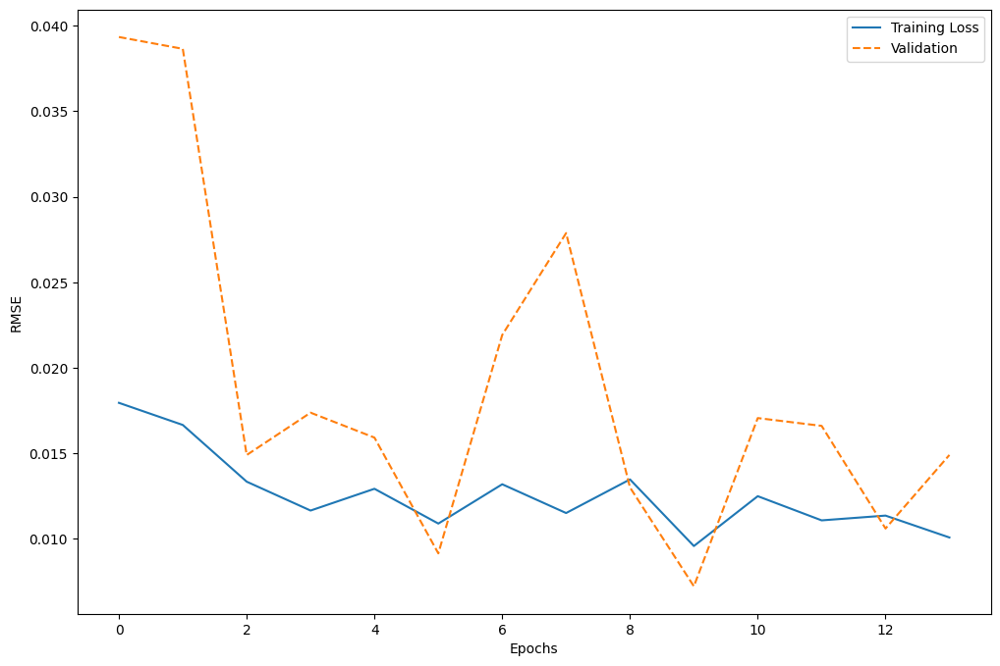

In [19]:
# Plotting training and validation loss
plt.figure(figsize=(12, 8))
plt.plot(hist.epoch, hist.history['loss'], label='Training Loss')
plt.plot(hist.epoch, hist.history['val_loss'], label='Validation', linestyle='--')
plt.xlabel("Epochs")
plt.ylabel("RMSE")
plt.legend()
plt.show()

## Re-create the ResNet50 model architecture with LoRA applied & model summary

In [20]:
# Re-create the ResNet50 model architecture with LoRA applied
img_shape = (224, 224, 3)

# Load the ResNet50 base model without the top layers
resnet_base = ResNet50(include_top=False, input_shape=img_shape)

# Apply LoRA to selected layers in ResNet-50
for layer in resnet_base.layers:
    if isinstance(layer, Dense):
        layer.trainable = False  # Freeze the original Dense layers
        layer = apply_lora(layer)  # Apply LoRA

# Add the final layers
x = Flatten()(resnet_base.output)
x = Dense(len(classes), activation='sigmoid')(x)

# Construct the final model
model = Model(inputs=resnet_base.input, outputs=x)

# Load the saved weights into the model
model.load_weights('/kaggle/working/model/model.keras')

# Confirm the model structure
print(model.summary())

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 27,300,773 (104.14 MB)

 Trainable params: 27,247,653 (103.94 MB)

 Non-trainable params: 53,120 (207.50 KB)

None


In [21]:
from tensorflow.keras.models import load_model
model = load_model('/kaggle/working/model/model.keras')

In [22]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/central_pixel_benchmark.zip

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [24]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/all_zeros_benchmark.zip

In [29]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/images_test_rev1.zip

In [38]:
!mkdir -p /kaggle/working//images


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [39]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/images_test_rev1.zip -d /kaggle/working/images

## Test Data Preparation

In [40]:
# Define the path to your test data folder
test_data_path = '/kaggle/working/images'
# Load the test data using image_dataset_from_directory
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    test_data_path,
    image_size=(224, 224),  # ResNet-50 expects 224x224 input images
    batch_size=32,
    label_mode=None,  # No labels needed for test data
    shuffle=False     # Ensures order is preserved
)

# Normalize the images by scaling pixel values
normalization_layer = tf.keras.layers.Rescaling(1./255)
test_dataset = test_dataset.map(lambda x: normalization_layer(x))

# Make predictions
model = tf.keras.models.load_model('/kaggle/working/model/model.keras')
predictions = model.predict(test_dataset)

# If you want class labels, get the argmax for each prediction
predicted_classes = np.argmax(predictions, axis=-1)

# Print predictions
for idx, pred_class in enumerate(predicted_classes):
    print(f"Image {idx}: Predicted class {pred_class}")

Found 79975 files.
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 194s 76ms/step
Image 0: Predicted class 14
Image 1: Predicted class 14
Image 2: Predicted class 14
Image 3: Predicted class 14
Image 4: Predicted class 14
Image 5: Predicted class 1
Image 6: Predicted class 14
Image 7: Predicted class 13
Image 8: Predicted class 1
Image 9: Predicted class 13
Image 10: Predicted class 14
Image 11: Predicted class 14
Image 12: Predicted class 14
Image 13: Predicted class 14
Image 14: Predicted class 14
Image 15: Predicted class 14
Image 16: Predicted class 14
Image 17: Predicted class 0
Image 18: Predicted class 0
Image 19: Predicted class 14
Image 20: Predicted class 14
Image 21: Predicted class 0
Image 22: Predicted class 14
Image 23: Predicted class 14
Image 24: Predicted class 14
Image 25: Predicted class 1
Image 26: Predicted class 1
Image 27: Predicted class 14
Image 28: Predicted class 14
Image 29: Predicted class 14
Image 30: Predicted class 14
Image 31: Predicted class 14
Image 32: Predicted clas

## Preparing Predictions_Lora.csv

In [42]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Set up ImageDataGenerator for testing data
test_datagen = ImageDataGenerator(rescale=1.0/255)
test_generator = test_datagen.flow_from_directory(
    '/kaggle/working/images',  # Update this path to your test data directory
    target_size=(224, 224),  # Adjust target size based on your model's input size
    batch_size=32,
    class_mode=None,
    shuffle=False
)

# Define get_id function
def get_id(filepath):
    return os.path.splitext(os.path.basename(filepath))[0]

# Get the current working directory
current_directory = os.getcwd()
print("Current directory:", current_directory)

# Construct the full path to the file
file_path = os.path.join(current_directory, '/kaggle/working/all_zeros_benchmark.csv')

# Try opening the file and reading the header
try:
    with open(file_path, 'r') as file:
        header = file.readline()  # Read the first line as the header
except FileNotFoundError:
    print(f"Error: File not found at {file_path}")
    header ="GalaxyID, Class1.1, Class1.2, Class1.3, Class2.1, Class2.2, Class3.1, Class3.2, Class4.1, Class4.2, Class5.1, Class5.2, Class5.3, Class5.4, Class6.1, Class6.2, Class7.1, Class7.2, Class7.3, Class8.1, Class8.2, Class8.3, Class8.4, Class8.5, Class8.6, Class8.7, Class9.1, Class9.2, Class9.3, Class10.1, Class10.2, Class10.3, Class11.1, Class11.2, Class11.3, Class11.4, Class11.5, Class11.6\n"  # Provide a default header if the file is missing

# Assume predictions is defined (e.g., from model predictions on test_generator)
# Example: predictions = model.predict(test_generator)

# Write predictions to Predictions_Lora.csv
with open('/kaggle/working/Predictions_Lora.csv', 'w') as outfile:
    outfile.write(header)
    for i in range(len(test_generator.filenames)):
        id_ = get_id(test_generator.filenames[i])  # Extract ID from filename
        pred = predictions[i]  # predictions should be your model's output
        outline = id_ + "," + ",".join([str(x) for x in pred])
        outfile.write(outline + "\n")

Found 79975 images belonging to 1 classes.
Current directory: /kaggle/working


## Calculating RMSE across all columns and rows

In [50]:
import pandas as pd
import numpy as np

# Load the actual and predicted values from the CSV files
actual_df = pd.read_csv('/kaggle/working/central_pixel_benchmark.csv')
predicted_df = pd.read_csv('/kaggle/working/Predictions_Lora.csv')

# Ensure that both dataframes have the same shape
assert actual_df.shape == predicted_df.shape, "The actual and predicted files must have the same shape."

# Exclude the 'GalaxyID' column and calculate RMSE for the remaining columns
actual_values = actual_df.iloc[:, 1:].values  # Exclude GalaxyID
predicted_values = predicted_df.iloc[:, 1:].values  # Exclude GalaxyID

# Calculate RMSE across all columns and rows
rmse = np.sqrt(np.mean((predicted_values - actual_values) ** 2))
print("Root Mean Squared Error:", rmse)


Root Mean Squared Error: 0.12078900037873723


## Calculating accuracy

In [53]:
actual_df = pd.read_csv('/kaggle/working/central_pixel_benchmark.csv')
predicted_df = pd.read_csv('/kaggle/working/Predictions_Lora.csv')

# list of class columns
class_columns = actual_df.columns[1:]

# Determining the predicted class based on the highest probability for each row
actual_df['Predicted_Class'] = actual_df[class_columns].idxmax(axis=1)
predicted_df['Predicted_Class'] = predicted_df[class_columns].idxmax(axis=1)

# Merging on GalaxyID to align predictions with actual values
merged_df = pd.merge(actual_df[['GalaxyID', 'Predicted_Class']], predicted_df[['GalaxyID', 'Predicted_Class']], on='GalaxyID', suffixes=('_actual', '_predicted'))


accuracy = np.mean(merged_df['Predicted_Class_actual'] == merged_df['Predicted_Class_predicted'])
accuracy 

0.7804814004376368

In [44]:
predicted_df.head()

,GalaxyID,Class1.1,Class1.2,Class1.3,Class2.1,Class2.2,Class3.1,Class3.2,Class4.1,Class4.2,...,Class9.3,Class10.1,Class10.2,Class10.3,Class11.1,Class11.2,Class11.3,Class11.4,Class11.5,Class11.6
0,100018,0.562374,0.427778,0.020285,0.064046,0.401625,0.080961,0.336848,0.098128,0.339471,...,0.007900,0.050170,0.030585,0.017128,0.007357,0.022791,0.001481,0.000841,0.001533,0.075264
1,100037,0.467336,0.514178,0.006646,0.384358,0.147135,0.037746,0.111696,0.052104,0.104532,...,0.131542,0.016271,0.015650,0.013204,0.001582,0.015942,0.000152,0.000134,0.000234,0.023521
2,100042,0.604665,0.375721,0.009394,0.171421,0.167664,0.028876,0.138597,0.053160,0.112602,...,0.018215,0.017596,0.012717,0.006760,0.000916,0.010140,0.000076,0.000054,0.000222,0.023492
3,100052,0.583143,0.389017,0.036624,0.007951,0.392917,0.051088,0.364694,0.104470,0.308722,...,0.001484,0.048836,0.031283,0.019396,0.016615,0.026124,0.004847,0.002797,0.003779,0.067624
4,100056,0.225045,0.769675,0.002270,0.764976,0.033659,0.005494,0.026741,0.011415,0.023363,...,0.294320,0.003728,0.003920,0.002899,0.000713,0.002738,0.000158,0.000167,0.000202,0.006985


# **Accuracy of the Model: 78.05%**

## **Problem_Statement-02**
# **Finetunning the pre-trained resnet50 model on the train split of Galaxyzoo dataset and evaluate it on its test split**

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/galaxy-zoo-the-galaxy-challenge/all_ones_benchmark.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/images_test_rev1.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/central_pixel_benchmark.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/images_training_rev1.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/all_zeros_benchmark.zip
/kaggle/input/galaxy-zoo-the-galaxy-challenge/training_solutions_rev1.zip


## Importing Libraries

In [2]:
%matplotlib inline
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
from importlib import reload
import glob
from shutil import copyfile
import keras
import tensorflow as tf 
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras import optimizers

In [3]:
!unzip /kaggle/input/galaxy-zoo-the-galaxy-challenge/images_training_rev1.zip

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Archive:  /kaggle/input/galaxy-zoo-the-galaxy-challenge/images_training_rev1.zip
   creating: images_training_rev1/
  inflating: images_training_rev1/100008.jpg  
  inflating: images_training_rev1/100023.jpg  
  inflating: images_training_rev1/100053.jpg  
  inflating: images_training_rev1/100078.jpg  
  inflating: images_training_rev1/100090.jpg  
  inflating: images_training_rev1/100122.jpg  
  inflating: images_training_rev1/100123.jpg  
  inflating: images_training_rev1/100128.jpg  
  inflating: images_training_rev1/100134.jpg  
  inflating: images_training_rev1/100143.jpg  
  inflating: images_training_rev1/100150.jpg  
  inflating: images_training_rev1/100157.jpg  
  inflating: images_training_rev1/100187.jpg  
  inflating: images_training_rev1/100204.jpg  
  inflating: images_training_rev1/100237.jpg  
  inflating: images_training_rev1/100259.jpg  
  inflating: images_training_rev1/100263.jpg  
  inflating: images_training_rev1/100288.jpg  
  inflating: images_training_rev1/1002

In [4]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/training_solutions_rev1.zip

In [5]:
img_shape = (224, 224, 3)

resnet_model = ResNet50(include_top=False, input_shape=img_shape)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


## Classes & train_validation_split

In [6]:
classes = [
    'Class1.1', 'Class1.2', 'Class1.3', 'Class2.1', 'Class2.2', 'Class3.1',
    'Class3.2', 'Class4.1', 'Class4.2', 'Class5.1', 'Class5.2', 'Class5.3',
    'Class5.4', 'Class6.1', 'Class6.2', 'Class7.1', 'Class7.2', 'Class7.3',
    'Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5', 'Class8.6',
    'Class8.7', 'Class9.1', 'Class9.2', 'Class9.3', 'Class10.1', 'Class10.2',
    'Class10.3', 'Class11.1', 'Class11.2', 'Class11.3', 'Class11.4',
    'Class11.5', 'Class11.6'
]


def append_ext(fn):
    return fn + ".jpg"


traindf = pd.read_csv('/kaggle/working/training_solutions_rev1.csv')

traindf["id"] = traindf['GalaxyID'].astype(str).apply(append_ext)

datagen = ImageDataGenerator(
    fill_mode='nearest',
    cval=0,
    rescale=1. / 255,
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.02)

train_generator = datagen.flow_from_dataframe(
    dataframe=traindf,
    directory="/kaggle/working/images_training_rev1",
    x_col="id",
    y_col=classes,
    subset="training",
    batch_size=64,
    seed=123,
    shuffle=True,
    class_mode="other",
    target_size=(224, 224))

valid_generator = datagen.flow_from_dataframe(
    dataframe=traindf,
    directory="/kaggle/working/images_training_rev1",
    x_col="id",
    y_col=classes,
    subset="validation",
    batch_size=64,
    seed=123,
    shuffle=True,
    class_mode="other",
    target_size=(224, 224))

STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size

Found 60347 validated image filenames.
Found 1231 validated image filenames.


In [7]:
# Flatten output of last layer before adding output layer (Dense layer)
x = Flatten()(resnet_model.output)

# Add output layer (number of outputs = 37)
x = Dense(len(classes), activation='sigmoid')(x)

# Load the modified model
model = Model(inputs=resnet_model.input, outputs=x)

In [8]:
print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 27,300,773 (104.14 MB)

 Trainable params: 27,247,653 (103.94 MB)

 Non-trainable params: 53,120 (207.50 KB)

None


In [9]:
for layer in model.layers:
    layer.trainable = True

optimizer = keras.optimizers.Adam(learning_rate=0.001, decay=5e-4)

model.compile(optimizer, loss='mse', metrics=["accuracy"])

/opt/conda/lib/python3.10/site-packages/keras/src/optimizers/base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [10]:
from keras.callbacks import Callback
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping


class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.val_losses = []

    def on_batch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))


early_stopping = EarlyStopping(
    monitor='val_loss', patience=4, verbose=1, mode='auto')

history = LossHistory()

from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(
    filepath='/kaggle/working/model/model_finetunned.keras', verbose=2, save_best_only=True)

## model training

In [11]:
hist = model.fit(
    train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=valid_generator,
    validation_steps=STEP_SIZE_VALID,
    epochs=30,
    callbacks=[history, checkpointer, early_stopping])

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1731258711.517465     109 service.cc:145] XLA service 0x7bbad0003900 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731258711.517530     109 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1731258711.517535     109 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1731258744.597838     109 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_27', 20 bytes spill stores, 20 bytes spill loads

I0000 00:00:1731258744.641

397/942 ━━━━━━━━━━━━━━━━━━━━ 8:08 896ms/step - accuracy: 0.5905 - loss: 0.0312

I0000 00:00:1731259130.440435     107 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_27', 20 bytes spill stores, 20 bytes spill loads



942/942 ━━━━━━━━━━━━━━━━━━━━ 0s 928ms/step - accuracy: 0.6292 - loss: 0.0244
Epoch 1: val_loss improved from inf to 0.04819, saving model to /kaggle/working/model/model_finetunned.keras
942/942 ━━━━━━━━━━━━━━━━━━━━ 968s 952ms/step - accuracy: 0.6292 - loss: 0.0244 - val_accuracy: 0.5296 - val_loss: 0.0482
Epoch 2/30
  1/942 ━━━━━━━━━━━━━━━━━━━━ 7:51 501ms/step - accuracy: 0.6719 - loss: 0.0170

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 2: val_loss improved from 0.04819 to 0.04377, saving model to /kaggle/working/model/model_finetunned.keras
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.6719 - loss: 0.0170 - val_accuracy: 0.5333 - val_loss: 0.0438
Epoch 3/30
942/942 ━━━━━━━━━━━━━━━━━━━━ 0s 890ms/step - accuracy: 0.6662 - loss: 0.0169
Epoch 3: val_loss improved from 0.04377 to 0.03601, saving model to /kaggle/working/model/model_finetunned.keras
942/942 ━━━━━━━━━━━━━━━━━━━━ 863s 910ms/step - accuracy: 0.6662 - loss: 0.0169 - val_accuracy: 0.5921 - val_loss: 0.0360
Epoch 4/30
  1/942 ━━━━━━━━━━━━━━━━━━━━ 8:48 562ms/step - accuracy: 0.7500 - loss: 0.0168
Epoch 4: val_loss did not improve from 0.03601
942/942 ━━━━━━━━━━━━━━━━━━━━ 1s 67us/step - accuracy: 0.7500 - loss: 0.0168 - val_accuracy: 0.6000 - val_loss: 0.0440
Epoch 5/30
942/942 ━━━━━━━━━━━━━━━━━━━━ 0s 889ms/step - accuracy: 0.7238 - loss: 0.0144
Epoch 5: val_loss improved from 0.03601 to 0.03045, saving model to /kaggle/working/model/model_finetunn

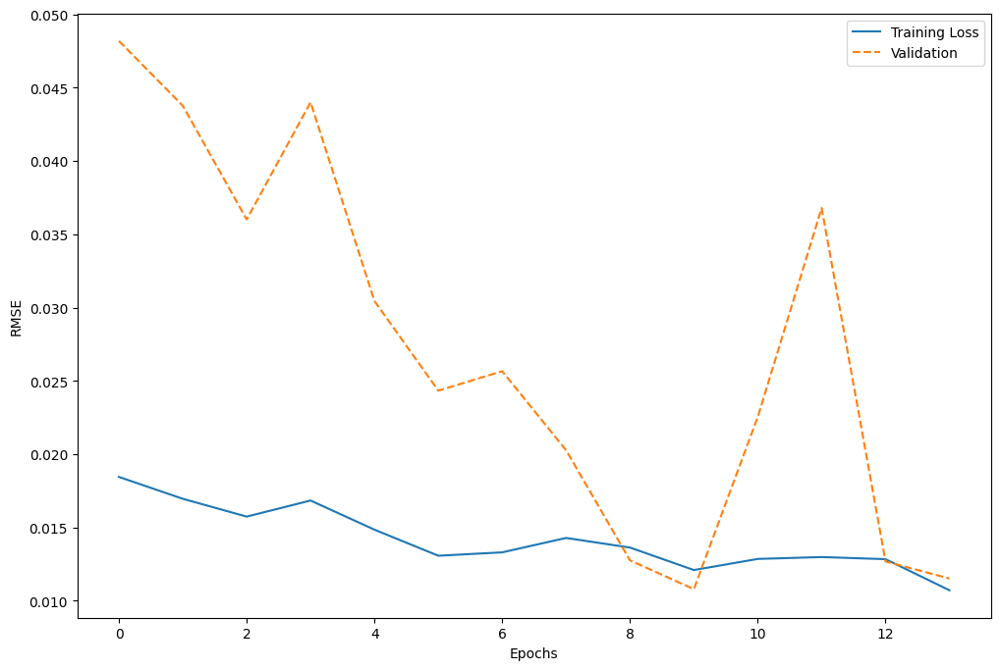

In [12]:
plt.figure(figsize=(12, 8))
plt.plot(hist.epoch, hist.history['loss'], label='Training Loss')
plt.plot(
    hist.epoch, hist.history['val_loss'], label='Validation', linestyle='--')
plt.xlabel("Epochs")
plt.ylabel("RMSE")
plt.legend()
plt.show()

In [13]:
from tensorflow.keras.models import load_model
model = load_model('/kaggle/working/model/model_finetunned.keras')

In [14]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/central_pixel_benchmark.zip

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [15]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/all_zeros_benchmark.zip

In [16]:
!mkdir -p /kaggle/working/images

In [17]:
!unzip -q /kaggle/input/galaxy-zoo-the-galaxy-challenge/images_test_rev1.zip -d /kaggle/working/images

## Test data preparation & making predictions

In [18]:
import tensorflow as tf
import numpy as np

# Define the path to your test data folder
test_data_path = '/kaggle/working/images'

# Load the test data using image_dataset_from_directory
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    test_data_path,
    image_size=(224, 224),  # ResNet-50 expects 224x224 input images
    batch_size=32,
    label_mode=None,  # No labels needed for test data
    shuffle=False     # Ensures order is preserved
)

# Normalize the images by scaling pixel values
normalization_layer = tf.keras.layers.Rescaling(1./255)
test_dataset = test_dataset.map(lambda x: normalization_layer(x))

# Make predictions
model = tf.keras.models.load_model('/kaggle/working/model/model_finetunned.keras')
predictions = model.predict(test_dataset)

# If you want class labels, get the argmax for each prediction
predicted_classes = np.argmax(predictions, axis=-1)

# Print predictions
for idx, pred_class in enumerate(predicted_classes):
    print(f"Image {idx}: Predicted class {pred_class}")


Found 79975 files.
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 203s 79ms/step
Image 0: Predicted class 14
Image 1: Predicted class 14
Image 2: Predicted class 14
Image 3: Predicted class 14
Image 4: Predicted class 14
Image 5: Predicted class 1
Image 6: Predicted class 1
Image 7: Predicted class 13
Image 8: Predicted class 1
Image 9: Predicted class 1
Image 10: Predicted class 14
Image 11: Predicted class 14
Image 12: Predicted class 1
Image 13: Predicted class 14
Image 14: Predicted class 14
Image 15: Predicted class 1
Image 16: Predicted class 1
Image 17: Predicted class 13
Image 18: Predicted class 14
Image 19: Predicted class 14
Image 20: Predicted class 14
Image 21: Predicted class 14
Image 22: Predicted class 14
Image 23: Predicted class 1
Image 24: Predicted class 14
Image 25: Predicted class 1
Image 26: Predicted class 1
Image 27: Predicted class 14
Image 28: Predicted class 14
Image 29: Predicted class 14
Image 30: Predicted class 14
Image 31: Predicted class 14
Image 32: Predicted class 1

## Preparing Predictions_finetunned.csv

In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Set up ImageDataGenerator for testing data
test_datagen = ImageDataGenerator(rescale=1.0/255)
test_generator = test_datagen.flow_from_directory(
    '/kaggle/working/images',  # Update this path to your test data directory
    target_size=(224, 224),  # Adjust target size based on your model's input size
    batch_size=32,
    class_mode=None,
    shuffle=False
)

# Define get_id function
def get_id(filepath):
    return os.path.splitext(os.path.basename(filepath))[0]

# Get the current working directory
current_directory = os.getcwd()
print("Current directory:", current_directory)

# Construct the full path to the file
file_path = os.path.join(current_directory, '/kaggle/working/all_zeros_benchmark.csv')

# Try opening the file and reading the header
try:
    with open(file_path, 'r') as file:
        header = file.readline()  # Read the first line as the header
except FileNotFoundError:
    print(f"Error: File not found at {file_path}")
    header ="GalaxyID, Class1.1, Class1.2, Class1.3, Class2.1, Class2.2, Class3.1, Class3.2, Class4.1, Class4.2, Class5.1, Class5.2, Class5.3, Class5.4, Class6.1, Class6.2, Class7.1, Class7.2, Class7.3, Class8.1, Class8.2, Class8.3, Class8.4, Class8.5, Class8.6, Class8.7, Class9.1, Class9.2, Class9.3, Class10.1, Class10.2, Class10.3, Class11.1, Class11.2, Class11.3, Class11.4, Class11.5, Class11.6\n"  

# Write predictions to Output.csv
with open('/kaggle/working/Predictions_finetunned.csv', 'w') as outfile:
    outfile.write(header)
    for i in range(len(test_generator.filenames)):
        id_ = get_id(test_generator.filenames[i])  # Extract ID from filename
        pred = predictions[i]  # predictions should be your model's output
        outline = id_ + "," + ",".join([str(x) for x in pred])
        outfile.write(outline + "\n")

Found 79975 images belonging to 1 classes.
Current directory: /kaggle/working


## Calculate RMSE 

In [20]:
import pandas as pd
import numpy as np

actual_df = pd.read_csv('/kaggle/working/central_pixel_benchmark.csv')
predicted_df = pd.read_csv('/kaggle/working/Predictions_finetunned.csv')

assert actual_df.shape == predicted_df.shape, "The actual and predicted files must have the same shape."

actual_values = actual_df.iloc[:, 1:].values  # Exclude GalaxyID
predicted_values = predicted_df.iloc[:, 1:].values  # Exclude GalaxyID

rmse = np.sqrt(np.mean((predicted_values - actual_values) ** 2))
print("Root Mean Squared Error:", rmse)


Root Mean Squared Error: 0.12540667931191746


## Calculating Accuracy

In [21]:
actual_df = pd.read_csv('/kaggle/working/central_pixel_benchmark.csv')
predicted_df = pd.read_csv('/kaggle/working/Predictions_finetunned.csv')

# list of class columns
class_columns = actual_df.columns[1:]

# Determining the predicted class based on the highest probability for each row
actual_df['Predicted_Class'] = actual_df[class_columns].idxmax(axis=1)
predicted_df['Predicted_Class'] = predicted_df[class_columns].idxmax(axis=1)

# Merging on GalaxyID to align predictions with actual values
merged_df = pd.merge(actual_df[['GalaxyID', 'Predicted_Class']], predicted_df[['GalaxyID', 'Predicted_Class']], on='GalaxyID', suffixes=('_actual', '_predicted'))

accuracy = np.mean(merged_df['Predicted_Class_actual'] == merged_df['Predicted_Class_predicted'])
accuracy 

0.6553172866520788

In [22]:
predicted_df.head()

,GalaxyID,Class1.1,Class1.2,Class1.3,Class2.1,Class2.2,Class3.1,Class3.2,Class4.1,Class4.2,...,Class10.1,Class10.2,Class10.3,Class11.1,Class11.2,Class11.3,Class11.4,Class11.5,Class11.6,Predicted_Class
0,100018,0.487310,0.526300,0.019130,0.020794,0.484179,0.082029,0.350880,0.150500,0.292168,...,0.082413,0.048578,0.014032,0.011221,0.036627,0.004196,0.002769,0.003738,0.089892,Class6.2
1,100037,0.336400,0.680045,0.010646,0.279993,0.302624,0.047726,0.209677,0.099813,0.185804,...,0.060479,0.035608,0.013371,0.008080,0.026928,0.003270,0.001850,0.002573,0.067105,Class6.2
2,100042,0.595949,0.403552,0.011253,0.106878,0.180957,0.025684,0.114390,0.049415,0.119921,...,0.030050,0.010947,0.004017,0.001619,0.006983,0.000430,0.000443,0.001208,0.031049,Class6.2
3,100052,0.540431,0.455426,0.030848,0.006567,0.392460,0.029677,0.364512,0.097307,0.256053,...,0.045995,0.030392,0.011021,0.010130,0.017295,0.005278,0.003912,0.004596,0.065646,Class6.2
4,100056,0.219613,0.792834,0.006116,0.624983,0.074442,0.011076,0.053281,0.024948,0.048058,...,0.010726,0.006602,0.004989,0.001995,0.007009,0.001532,0.001472,0.001501,0.016708,Class6.2


# ****Accuracy of the model: 65.53%****

## **Problem_Statement-03**

# **Using the pre-trained resnet50 model, evaluate it on the test split of the Galaxyzoo dataset(Without finetuning)**

## Importing Necessary Libraries

In [1]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import zipfile
import os

# Path to ZIP file
zip_path = '/content/drive/MyDrive/images_test_rev1.zip'

# Unzipping the images folder (only if you want to extract all images)
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/images')

## Setting up the base model with ResNet50 as the feature extractor

In [4]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
feature_extractor_model = Model(inputs=base_model.input, outputs=x)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


## Loading the test images using an ImageDataGenerator

In [5]:
test_data_path = '/content/images'  # Update this path to your test image directory
test_datagen = ImageDataGenerator(rescale=1.0/255)
test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode=None,
    shuffle=False
)

Found 79975 images belonging to 1 classes.


## Extracting features

In [6]:
test_features = feature_extractor_model.predict(test_generator, verbose=1)

# Placeholder to store predictions
predictions = pd.DataFrame(index=range(len(test_features)))

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2500/2500 ━━━━━━━━━━━━━━━━━━━━ 212s 82ms/step


In [7]:
len(test_features)

79975

In [8]:
# Utility function to create a classifier model on top of extracted features
def create_classifier(num_classes):
    input_layer = tf.keras.layers.Input(shape=(test_features.shape[1],))
    x = Dense(128, activation='relu')(input_layer)
    output_layer = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


## Step-by-step conditional predictions based on the hierarchy

In [9]:
# Class 1 (Parent) -> Subclasses: Class 1.1, Class 1.2, Class 1.3
class1_model = create_classifier(3)
class1_predictions = class1_model.predict(test_features)
predictions[['Class1.1', 'Class1.2', 'Class1.3']] = class1_predictions

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


In [10]:
# Class 6 (Parent) -> Subclasses: Class 6.1, Class 6.2
class6_model = create_classifier(2)
class6_predictions = class6_model.predict(test_features)
predictions[['Class6.1', 'Class6.2']] = class6_predictions

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step


In [11]:
# For Class 1.1 -> Subclasses: Class 7.1, Class 7.2, Class 7.3
class7_model = create_classifier(3)
if 'Class1.1' in predictions.columns:
    class7_predictions = class7_model.predict(test_features)
    # Scale subclass predictions by the probability of Class 1.1
    class7_predictions_scaled = class7_predictions * predictions['Class1.1'].values[:, np.newaxis]
    predictions[['Class7.1', 'Class7.2', 'Class7.3']] = class7_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


In [12]:
# For Class 1.2 -> Subclasses: Class 2.1, Class 2.2
class2_model = create_classifier(2)
class2_predictions = class2_model.predict(test_features)
class2_predictions_scaled = class2_predictions * predictions['Class1.2'].values[:, np.newaxis]
predictions[['Class2.1', 'Class2.2']] = class2_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


In [13]:
# For Class 2.1 -> Subclasses: Class 9.1, Class 9.2, Class 9.3
class9_model = create_classifier(3)
class9_predictions = class9_model.predict(test_features)
class9_predictions_scaled = class9_predictions * predictions['Class2.1'].values[:, np.newaxis]
predictions[['Class9.1', 'Class9.2', 'Class9.3']] = class9_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


In [14]:
# For Class 2.2 -> Subclasses: Class 3.1, Class 3.2
class3_model = create_classifier(2)
class3_predictions = class3_model.predict(test_features)
class3_predictions_scaled = class3_predictions * predictions['Class2.2'].values[:, np.newaxis]
predictions[['Class3.1', 'Class3.2']] = class3_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


In [15]:
# For Class 3.1 -> Subclasses: Class 4.1, Class 4.2
class4_model = create_classifier(2)
class4_predictions = class4_model.predict(test_features)
class4_predictions_scaled = class4_predictions * predictions['Class3.1'].values[:, np.newaxis]
predictions[['Class4.1', 'Class4.2']] = class4_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


In [16]:
# For Class 4.1 -> Subclasses: Class 10.1, Class 10.2, Class 10.3
class10_model = create_classifier(3)
class10_predictions = class10_model.predict(test_features)
class10_predictions_scaled = class10_predictions * predictions['Class4.1'].values[:, np.newaxis]
predictions[['Class10.1', 'Class10.2', 'Class10.3']] = class10_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


In [17]:
# For Class 10 -> Six subclasses of Class 11
class11_model = create_classifier(6)
class11_predictions = class11_model.predict(test_features)
class11_predictions_scaled = class11_predictions * (predictions[['Class10.1', 'Class10.2', 'Class10.3']].sum(axis=1).values[:, np.newaxis])
predictions[['Class11.1', 'Class11.2', 'Class11.3', 'Class11.4', 'Class11.5', 'Class11.6']] = class11_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


In [18]:
# For Class 6 -> Class 8.1 to 8.7
class8_model = create_classifier(7)
class8_predictions = class8_model.predict(test_features)
class8_predictions_scaled = class8_predictions * (predictions[['Class6.1', 'Class6.2']].sum(axis=1).values[:, np.newaxis])
predictions[['Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5', 'Class8.6', 'Class8.7']] = class8_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


In [19]:
# For Class 5 -> Class 4.2. & class 11.1 to 11.6
class8_model = create_classifier(4)
class8_predictions = class8_model.predict(test_features)
class8_predictions_scaled = class8_predictions * (predictions[['Class4.2', 'Class11.1', 'Class11.2', 'Class11.3', 'Class11.4', 'Class11.5', 'Class11.6']].sum(axis=1).values[:, np.newaxis])
predictions[['Class5.1', 'Class5.2', 'Class5.3', 'Class5.4']] = class8_predictions_scaled

2500/2500 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


## Arranging the columns according classes

In [22]:
classes = [
    'Class1.1', 'Class1.2', 'Class1.3', 'Class2.1', 'Class2.2', 'Class3.1',
    'Class3.2', 'Class4.1', 'Class4.2', 'Class5.1', 'Class5.2', 'Class5.3',
    'Class5.4', 'Class6.1', 'Class6.2', 'Class7.1', 'Class7.2', 'Class7.3',
    'Class8.1', 'Class8.2', 'Class8.3', 'Class8.4', 'Class8.5', 'Class8.6',
    'Class8.7', 'Class9.1', 'Class9.2', 'Class9.3', 'Class10.1', 'Class10.2',
    'Class10.3', 'Class11.1', 'Class11.2', 'Class11.3', 'Class11.4',
    'Class11.5', 'Class11.6'
]

In [24]:
actual_df = pd.read_csv('/content/central_pixel_benchmark.csv')
predicted_df = pd.DataFrame(predictions, columns=classes)

In [25]:
# Add the 'GalaxyID' column from actual_df to predicted_df
predicted_df.insert(0, 'GalaxyID', actual_df['GalaxyID'])

# Now predicted_df should have the same structure as actual_df
print(predicted_df.head())

   GalaxyID  Class1.1  Class1.2  Class1.3  Class2.1  Class2.2  Class3.1  \
0    100018  0.258719  0.421562  0.319720  0.075166  0.346396  0.264119   
1    100037  0.258239  0.420937  0.320824  0.074954  0.345983  0.263664   
2    100042  0.254751  0.426353  0.318896  0.075992  0.350361  0.267044   
3    100052  0.259551  0.421919  0.318530  0.075001  0.346918  0.264623   
4    100056  0.260570  0.421842  0.317588  0.074106  0.347735  0.265463   

   Class3.2  Class4.1  Class4.2  ...  Class9.3  Class10.1  Class10.2  \
0  0.082277  0.218147  0.045971  ...  0.006466   0.028785   0.021476   
1  0.082320  0.218497  0.045167  ...  0.006287   0.028803   0.021387   
2  0.083317  0.221015  0.046029  ...  0.006549   0.029338   0.021963   
3  0.082295  0.218357  0.046267  ...  0.006486   0.028983   0.021696   
4  0.082272  0.219436  0.046027  ...  0.006273   0.029284   0.021685   

   Class10.3  Class11.1  Class11.2  Class11.3  Class11.4  Class11.5  Class11.6  
0   0.167887   0.025175   0.007657 

## Preparing Predictions_withoutfinetunned.csv

In [26]:
# Save the predictions to a CSV file
output_file_path = 'Predictions_withoutfinetunned.csv'
predicted_df.to_csv(output_file_path, index=False)

print(f"Predictions saved to {output_file_path}")

Predictions saved to Predictions_withoutfinetunned.csv


In [27]:
predicted_df.shape

(79975, 38)

## Calculating RMSE

In [28]:
import pandas as pd
import numpy as np

actual_df = pd.read_csv('/content/central_pixel_benchmark.csv')
predicted_df = pd.read_csv('/content/Predictions_withoutfinetunned.csv')

assert actual_df.shape == predicted_df.shape, "The actual and predicted files must have the same shape."

actual_values = actual_df.iloc[:, 1:].values  # Exclude GalaxyID
predicted_values = predicted_df.iloc[:, 1:].values  # Exclude GalaxyID

rmse = np.sqrt(np.mean((predicted_values - actual_values) ** 2))
print("Root Mean Squared Error:", rmse)

Root Mean Squared Error: 0.17770425666792677


## Calculating Accuracy

In [29]:
actual_df = pd.read_csv('/content/central_pixel_benchmark.csv')
predicted_df = pd.read_csv('/content/Predictions_withoutfinetunned.csv')

# list of class columns
class_columns = actual_df.columns[1:]

# Determining the predicted class based on the highest probability for each row
actual_df['Predicted_Class'] = actual_df[class_columns].idxmax(axis=1)
predicted_df['Predicted_Class'] = predicted_df[class_columns].idxmax(axis=1)

# Merging on GalaxyID to align predictions with actual values
merged_df = pd.merge(actual_df[['GalaxyID', 'Predicted_Class']], predicted_df[['GalaxyID', 'Predicted_Class']], on='GalaxyID', suffixes=('_actual', '_predicted'))

accuracy = np.mean(merged_df['Predicted_Class_actual'] == merged_df['Predicted_Class_predicted'])
accuracy

0.5836448890278212

# **Accuracy of the model : 58.36%**